In [220]:
import pandas as pd

# import pandas as pd
import numpy as np
from sklearn.cluster import KMeans, DBSCAN, MeanShift, AgglomerativeClustering, estimate_bandwidth
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage


In [221]:
df = pd.read_csv('C:\maestria\Ciclo 3\machine learning\segmentación_retail\Data\Clean\df_rfm_estandar.csv')
df.head(5)

,frequency,recency,monetary_value,avg_ticket,num_unique_products
0,-1.350976,2.377321,-3.641547,-3.159587,-1.685867
1,1.091181,-0.891276,1.431830,1.256260,0.896262
2,-0.392018,-0.154833,0.617603,0.733380,-0.514234
3,0.196383,-0.719775,0.598623,3.558188,0.502388
4,-0.699641,2.215909,-0.598876,0.299559,-0.676035


In [222]:
df.columns

Index(['frequency', 'recency', 'monetary_value', 'avg_ticket',
       'num_unique_products'],
      dtype='object')

In [223]:

X = df.values
X

array([[-1.35097597,  2.37732126, -3.64154712, -3.15958706, -1.68586734],
       [ 1.09118135, -0.89127588,  1.43183009,  1.25626019,  0.89626205],
       [-0.39201759, -0.1548327 ,  0.61760268,  0.73338049, -0.51423387],
       ...,
       [-0.81486685, -0.83074631, -0.9636133 , -1.43291394, -0.86973179],
       [ 3.23799289, -0.87109936,  0.72927237, -0.80488102,  2.28916093],
       [ 0.1626182 , -0.47765711,  0.63641337,  1.24681364,  0.28458245]])

In [224]:

# --- 1. Análisis con KMeans ---
# Evaluaremos KMeans para un rango de clústeres (k) y graficaremos las métricas.
print("\n--- Iniciando Análisis con KMeans ---")
k_range = range(2, 11)
kmeans_metrics = {
    'silhouette': [],
    'davies_bouldin': [],
    'calinski_harabasz': []
}

for k in k_range:
    print(f"Evaluando KMeans con k={k}...")
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    labels = kmeans.labels_
    
    # Calcular métricas solo si hay más de 1 clúster
    if len(set(labels)) > 1:
        kmeans_metrics['silhouette'].append(silhouette_score(X, labels))
        kmeans_metrics['davies_bouldin'].append(davies_bouldin_score(X, labels))
        kmeans_metrics['calinski_harabasz'].append(calinski_harabasz_score(X, labels))
    else:
        # Añadir valores nulos o marcadores si el clustering no es válido
        kmeans_metrics['silhouette'].append(np.nan)
        kmeans_metrics['davies_bouldin'].append(np.nan)
        kmeans_metrics['calinski_harabasz'].append(np.nan)




--- Iniciando Análisis con KMeans ---
Evaluando KMeans con k=2...
Evaluando KMeans con k=3...
Evaluando KMeans con k=4...
Evaluando KMeans con k=5...
Evaluando KMeans con k=6...
Evaluando KMeans con k=7...
Evaluando KMeans con k=8...
Evaluando KMeans con k=9...
Evaluando KMeans con k=10...


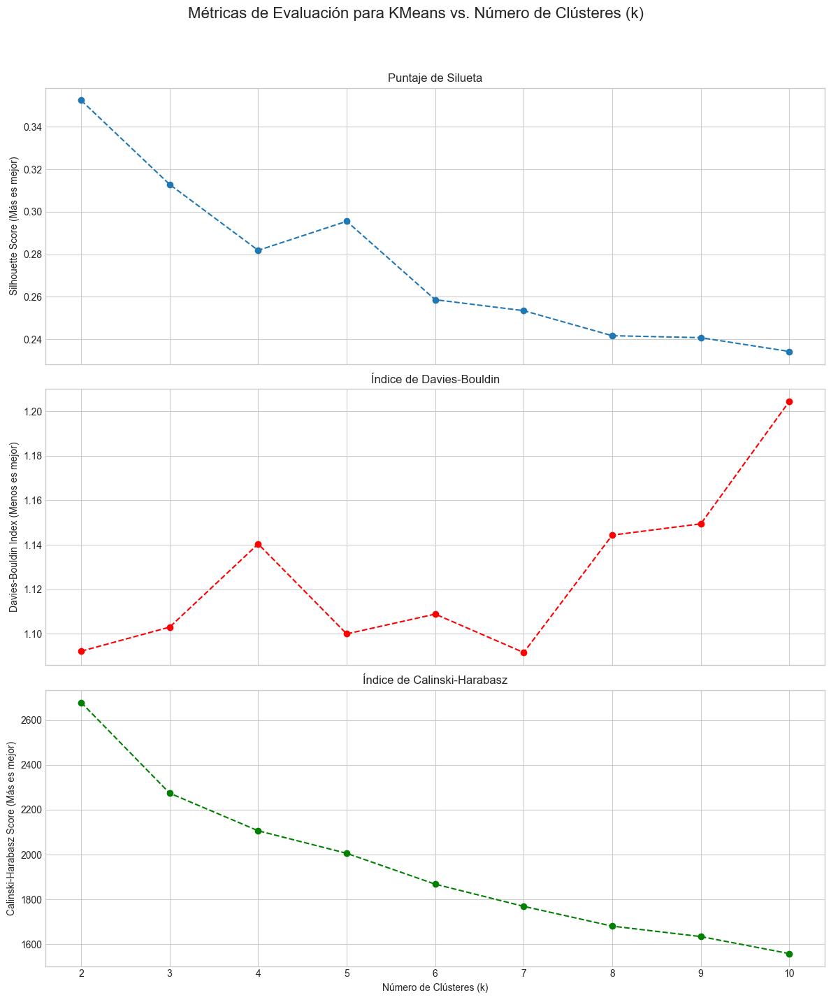

In [225]:

# Graficar las métricas para KMeans
plt.style.use('seaborn-v0_8-whitegrid')
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 15), sharex=True)
fig.suptitle('Métricas de Evaluación para KMeans vs. Número de Clústeres (k)', fontsize=16)

# Silhouette Score
ax1.plot(k_range, kmeans_metrics['silhouette'], marker='o', linestyle='--')
ax1.set_ylabel('Silhouette Score (Más es mejor)')
ax1.set_title('Puntaje de Silueta')

# Davies-Bouldin Index
ax2.plot(k_range, kmeans_metrics['davies_bouldin'], marker='o', linestyle='--', color='r')
ax2.set_ylabel('Davies-Bouldin Index (Menos es mejor)')
ax2.set_title('Índice de Davies-Bouldin')

# Calinski-Harabasz Score
ax3.plot(k_range, kmeans_metrics['calinski_harabasz'], marker='o', linestyle='--', color='g')
ax3.set_ylabel('Calinski-Harabasz Score (Más es mejor)')
ax3.set_xlabel('Número de Clústeres (k)')
ax3.set_title('Índice de Calinski-Harabasz')

plt.xticks(k_range)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
# plt.savefig("kmeans_metrics.png")
# print("Gráfico 'kmeans_metrics.png' guardado. Analízalo para elegir el 'k' óptimo.")

In [226]:


# --- 2. Análisis con Agglomerative Clustering ---
# Similar a KMeans, evaluaremos para un rango de clústeres.
print("\n--- Iniciando Análisis con Agglomerative Clustering ---")
agg_metrics = {
    'silhouette': [],
    'davies_bouldin': [],
    'calinski_harabasz': []
}

for k in k_range:
    print(f"Evaluando Agglomerative Clustering con k={k}...")
    agg_clustering = AgglomerativeClustering(n_clusters=k)
    labels = agg_clustering.fit_predict(X)
    
    if len(set(labels)) > 1:
        agg_metrics['silhouette'].append(silhouette_score(X, labels))
        agg_metrics['davies_bouldin'].append(davies_bouldin_score(X, labels))
        agg_metrics['calinski_harabasz'].append(calinski_harabasz_score(X, labels))
    else:
        agg_metrics['silhouette'].append(np.nan)
        agg_metrics['davies_bouldin'].append(np.nan)
        agg_metrics['calinski_harabasz'].append(np.nan)



--- Iniciando Análisis con Agglomerative Clustering ---
Evaluando Agglomerative Clustering con k=2...
Evaluando Agglomerative Clustering con k=3...
Evaluando Agglomerative Clustering con k=4...
Evaluando Agglomerative Clustering con k=5...
Evaluando Agglomerative Clustering con k=6...
Evaluando Agglomerative Clustering con k=7...
Evaluando Agglomerative Clustering con k=8...
Evaluando Agglomerative Clustering con k=9...
Evaluando Agglomerative Clustering con k=10...


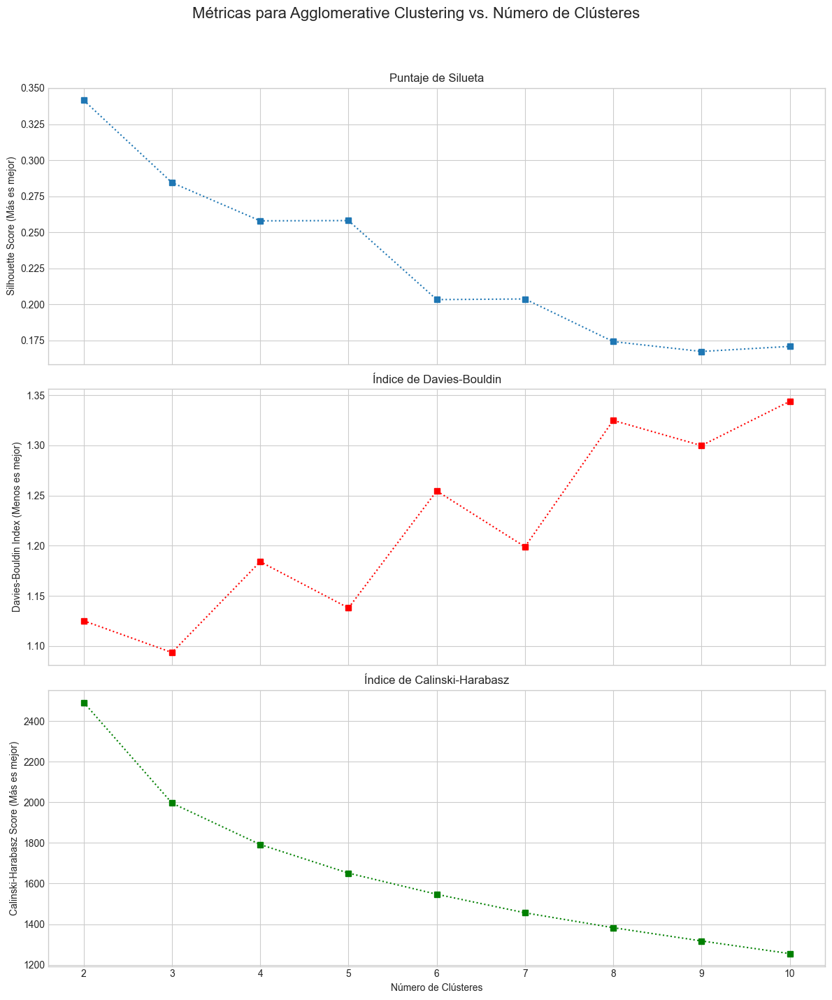


Generando dendrograma para Agglomerative Clustering...


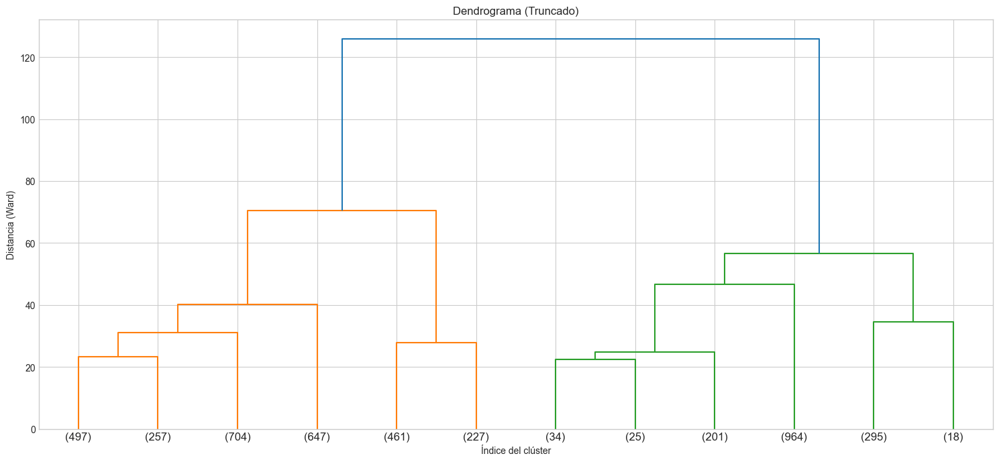

In [227]:

# Graficar las métricas para Agglomerative Clustering
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 15), sharex=True)
fig.suptitle('Métricas para Agglomerative Clustering vs. Número de Clústeres', fontsize=16)

ax1.plot(k_range, agg_metrics['silhouette'], marker='s', linestyle=':')
ax1.set_ylabel('Silhouette Score (Más es mejor)')
ax1.set_title('Puntaje de Silueta')

ax2.plot(k_range, agg_metrics['davies_bouldin'], marker='s', linestyle=':', color='r')
ax2.set_ylabel('Davies-Bouldin Index (Menos es mejor)')
ax2.set_title('Índice de Davies-Bouldin')

ax3.plot(k_range, agg_metrics['calinski_harabasz'], marker='s', linestyle=':', color='g')
ax3.set_ylabel('Calinski-Harabasz Score (Más es mejor)')
ax3.set_xlabel('Número de Clústeres')
ax3.set_title('Índice de Calinski-Harabasz')

plt.xticks(k_range)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
# plt.savefig("agg_clustering_metrics.png")
# print("Gráfico 'agg_clustering_metrics.png' guardado. Analízalo para elegir el número de clústeres.")

# Adicional: Generar un Dendrograma para ayudar a decidir
print("\nGenerando dendrograma para Agglomerative Clustering...")
plt.figure(figsize=(15, 7))
linked = linkage(X, method='ward')
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True,
           truncate_mode='lastp', # Muestra solo los últimos 'p' clústeres fusionados
           p=12) # Puedes ajustar 'p'
plt.title('Dendrograma (Truncado)')
plt.xlabel('Índice del clúster')
plt.ylabel('Distancia (Ward)')
plt.tight_layout()
plt.show()
# plt.savefig("dendrogram.png")
# print("Gráfico 'dendrogram.png' guardado. Úsalo como guía visual para cortar el árbol y definir clústeres.")

In [228]:


# --- 3. Análisis con DBSCAN ---
# DBSCAN no requiere un número de clústeres, pero sí 'eps' y 'min_samples'.
# Estos valores deben ser ajustados. Aquí usamos valores de ejemplo.
print("\n--- Iniciando Análisis con DBSCAN ---")
# Debes ajustar `eps` y `min_samples` según tu dataset.
# `eps` es la distancia máxima entre dos muestras para que una se considere en la vecindad de la otra.
# `min_samples` es el número de muestras en una vecindad para que un punto se considere como un punto central.
dbscan = DBSCAN(eps=0.466, min_samples=40) # <-- ¡AJUSTA ESTOS VALORES!
labels_dbscan = dbscan.fit_predict(X)

# Número de clústeres encontrados (excluyendo el ruido, etiquetado como -1)
n_clusters_dbscan = len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
n_noise = list(labels_dbscan).count(-1)

print(f"DBSCAN encontró {n_clusters_dbscan} clústeres y {n_noise} puntos de ruido.")

# Calcular métricas (solo si se encontró más de 1 clúster)
if n_clusters_dbscan > 1:
    # Es crucial excluir los puntos de ruido para calcular las métricas
    mask = labels_dbscan != -1
    silhouette_dbscan = silhouette_score(X[mask], labels_dbscan[mask])
    davies_bouldin_dbscan = davies_bouldin_score(X[mask], labels_dbscan[mask])
    calinski_harabasz_dbscan = calinski_harabasz_score(X[mask], labels_dbscan[mask])
    
    print(f"  - Silhouette Score: {silhouette_dbscan:.4f}")
    print(f"  - Davies-Bouldin Index: {davies_bouldin_dbscan:.4f}")
    print(f"  - Calinski-Harabasz Score: {calinski_harabasz_dbscan:.4f}")
else:
    print("  - No se pudo calcular las métricas porque DBSCAN no encontró suficientes clústeres.")



--- Iniciando Análisis con DBSCAN ---
DBSCAN encontró 2 clústeres y 1877 puntos de ruido.
  - Silhouette Score: 0.4239
  - Davies-Bouldin Index: 0.8061
  - Calinski-Harabasz Score: 1409.7365


In [229]:
# --- 4. Análisis con MeanShift ---
# MeanShift tampoco necesita el número de clústeres. El parámetro clave es `bandwidth`.
# Podemos estimarlo automáticamente.
print("\n--- Iniciando Análisis con MeanShift ---")
# Estimar el ancho de banda. El parámetro `quantile` puede ser ajustado.
bandwidth = estimate_bandwidth(X, quantile=0.7, n_samples=500)
print(f"Ancho de banda (bandwidth) estimado para MeanShift: {bandwidth:.4f}")

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
labels_ms = ms.fit_predict(X)

n_clusters_ms = len(np.unique(labels_ms))
print(f"MeanShift encontró {n_clusters_ms} clústeres.")

# Calcular métricas (solo si se encontró más de 1 clúster)
if n_clusters_ms > 1:
    silhouette_ms = silhouette_score(X, labels_ms)
    davies_bouldin_ms = davies_bouldin_score(X, labels_ms)
    calinski_harabasz_ms = calinski_harabasz_score(X, labels_ms)

    print(f"  - Silhouette Score: {silhouette_ms:.4f}")
    print(f"  - Davies-Bouldin Index: {davies_bouldin_ms:.4f}")
    print(f"  - Calinski-Harabasz Score: {calinski_harabasz_ms:.4f}")
else:
    print("  - No se pudo calcular las métricas porque MeanShift no encontró suficientes clústeres.")


--- Iniciando Análisis con MeanShift ---
Ancho de banda (bandwidth) estimado para MeanShift: 3.0779
MeanShift encontró 4 clústeres.
  - Silhouette Score: 0.5842
  - Davies-Bouldin Index: 0.9399
  - Calinski-Harabasz Score: 189.8313



--- Generando Visualización de Clústeres con PCA ---


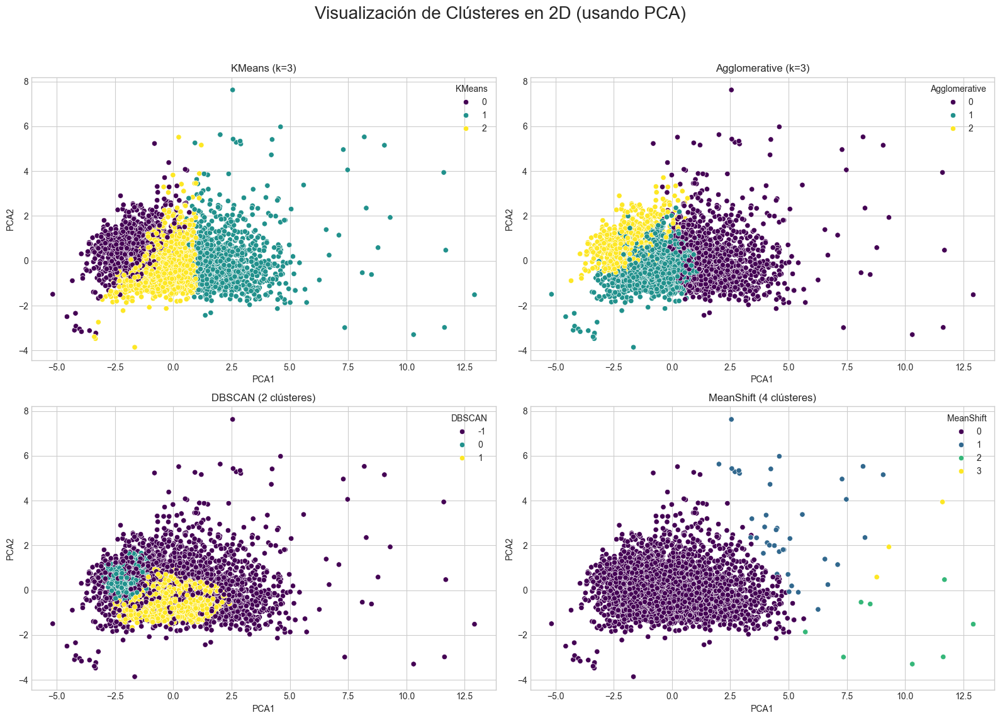

In [266]:
# --- 5. Visualización de Clústeres (Recomendado) ---
# Usa PCA para reducir la dimensionalidad a 2D y visualizar los resultados.
# Esto es útil para inspeccionar visualmente la calidad de los clústeres.
print("\n--- Generando Visualización de Clústeres con PCA ---")
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Elige el 'k' que decidiste para KMeans y Agglomerative para visualizar
k_optimo = 3 # <-- CAMBIA ESTE VALOR BASADO EN TU ANÁLISIS DE LAS MÉTRICAS

# Re-entrenar KMeans con el k óptimo
kmeans_final = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
labels_kmeans_final = kmeans_final.fit_predict(X)

# Re-entrenar Agglomerative con el k óptimo
agg_final = AgglomerativeClustering(n_clusters=k_optimo)
labels_agg_final = agg_final.fit_predict(X)

# Crear un DataFrame para la visualización
df_pca = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
df_pca['KMeans'] = labels_kmeans_final
df_pca['Agglomerative'] = labels_agg_final
df_pca['DBSCAN'] = labels_dbscan
df_pca['MeanShift'] = labels_ms

# Graficar los resultados
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Visualización de Clústeres en 2D (usando PCA)', fontsize=20)

sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='KMeans', palette='viridis', ax=axes[0, 0], legend='full')
axes[0, 0].set_title(f'KMeans (k={k_optimo})')

sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='Agglomerative', palette='viridis', ax=axes[0, 1], legend='full')
axes[0, 1].set_title(f'Agglomerative (k={k_optimo})')

sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='DBSCAN', palette='viridis', ax=axes[1, 0], legend='full')
axes[1, 0].set_title(f'DBSCAN ({n_clusters_dbscan} clústeres)')

sns.scatterplot(data=df_pca, x='PCA1', y='PCA2', hue='MeanShift', palette='viridis', ax=axes[1, 1], legend='full')
axes[1, 1].set_title(f'MeanShift ({n_clusters_ms} clústeres)')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
# plt.savefig("cluster_visualization_pca.png")
# print("Gráfico 'cluster_visualization_pca.png' guardado. ¡Úsalo para la inspección visual!")


--- Generando Visualización de Clústeres con t-SNE ---
El cálculo de t-SNE puede tardar unos momentos...


c:\python_environments\venv3.11.7_ds_2024\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Cálculo de t-SNE finalizado.


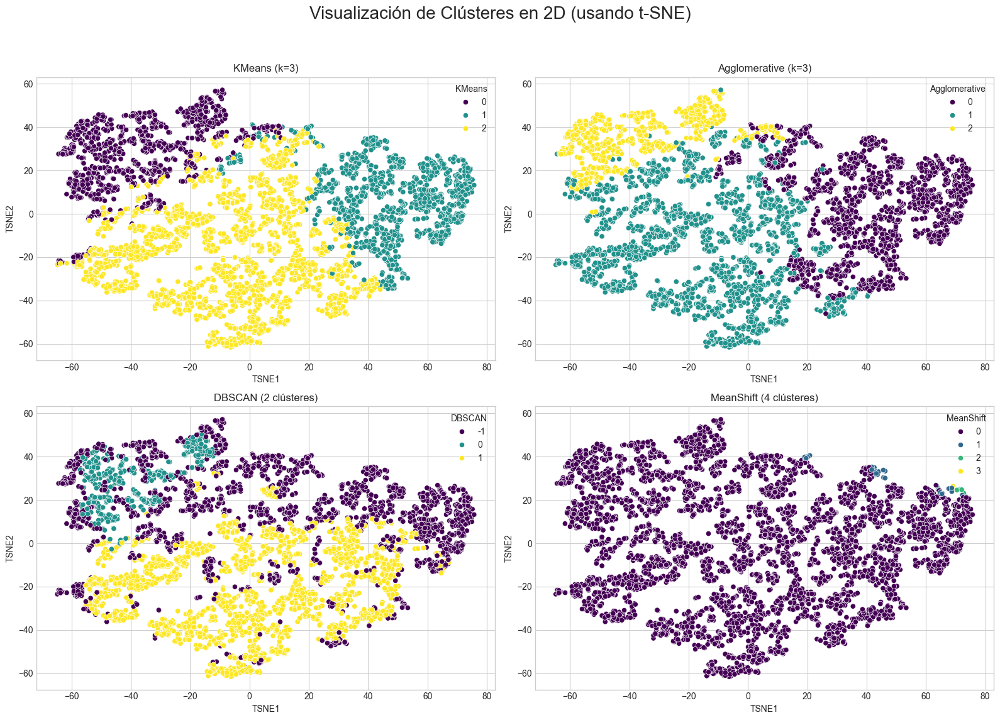

In [267]:
# --- 5. Visualización de Clústeres con t-SNE (Versión Modificada) ---
# Usa t-SNE para reducir la dimensionalidad a 2D y visualizar los resultados.
# t-SNE es excelente para visualizar la separación de clústeres.
print("\n--- Generando Visualización de Clústeres con t-SNE ---")
print("El cálculo de t-SNE puede tardar unos momentos...")

# Creamos y ajustamos el modelo t-SNE.
# Parámetros comunes: perplexity (usualmente entre 5 y 50), n_iter (al menos 1000).
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
X_tsne = tsne.fit_transform(X)

print("Cálculo de t-SNE finalizado.")

# Elige el 'k' que decidiste para KMeans y Agglomerative para visualizar
k_optimo = 3 # <-- CAMBIA ESTE VALOR BASADO EN TU ANÁLISIS DE LAS MÉTRICAS

# Re-entrenar KMeans con el k óptimo
kmeans_final = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
labels_kmeans_final = kmeans_final.fit_predict(X)

# Re-entrenar Agglomerative con el k óptimo
agg_final = AgglomerativeClustering(n_clusters=k_optimo)
labels_agg_final = agg_final.fit_predict(X)

# Crear un DataFrame para la visualización con los resultados de t-SNE
df_tsne = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
df_tsne['KMeans'] = labels_kmeans_final
df_tsne['Agglomerative'] = labels_agg_final
df_tsne['DBSCAN'] = labels_dbscan
df_tsne['MeanShift'] = labels_ms

# Graficar los resultados
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Visualización de Clústeres en 2D (usando t-SNE)', fontsize=20) # <-- Título actualizado

# Gráfico para KMeans
sns.scatterplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='KMeans', palette='viridis', ax=axes[0, 0], legend='full')
axes[0, 0].set_title(f'KMeans (k={k_optimo})')

# Gráfico para Agglomerative Clustering
sns.scatterplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='Agglomerative', palette='viridis', ax=axes[0, 1], legend='full')
axes[0, 1].set_title(f'Agglomerative (k={k_optimo})')

# Gráfico para DBSCAN
sns.scatterplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='DBSCAN', palette='viridis', ax=axes[1, 0], legend='full')
axes[1, 0].set_title(f'DBSCAN ({n_clusters_dbscan} clústeres)')

# Gráfico para MeanShift
sns.scatterplot(data=df_tsne, x='TSNE1', y='TSNE2', hue='MeanShift', palette='viridis', ax=axes[1, 1], legend='full')
axes[1, 1].set_title(f'MeanShift ({n_clusters_ms} clústeres)')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig("cluster_visualization_tsne.png")
# print("Gráfico 'cluster_visualization_tsne.png' guardado.")
plt.show()



--- Generando Visualización de Clústeres con UMAP ---


c:\python_environments\venv3.11.7_ds_2024\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


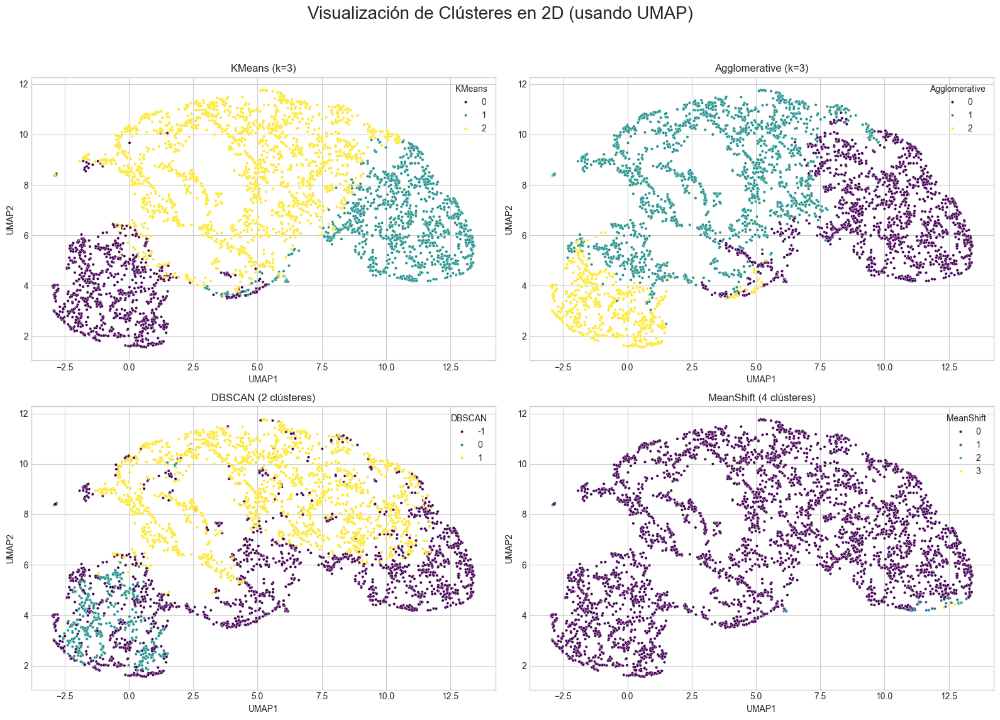

In [268]:
# --- 5. Visualización de Clústeres con UMAP ---
print("\n--- Generando Visualización de Clústeres con UMAP ---")

# Instanciar y aplicar UMAP para reducir la dimensionalidad
# Puedes experimentar con n_neighbors y min_dist para ajustar la visualización
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap = reducer.fit_transform(X)

# Crear un DataFrame para la visualización con las nuevas dimensiones UMAP
df_umap = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])
df_umap['KMeans'] = labels_kmeans_final
df_umap['Agglomerative'] = labels_agg_final
df_umap['DBSCAN'] = labels_dbscan
df_umap['MeanShift'] = labels_ms

# Elige el 'k' que decidiste para KMeans y Agglomerative para visualizar
k_optimo = 3 # <-- CAMBIA ESTE VALOR BASADO EN TU ANÁLISIS DE LAS MÉTRICAS

# Re-entrenar KMeans con el k óptimo
kmeans_final = KMeans(n_clusters=k_optimo, random_state=42, n_init=10)
labels_kmeans_final = kmeans_final.fit_predict(X)

# Re-entrenar Agglomerative con el k óptimo
agg_final = AgglomerativeClustering(n_clusters=k_optimo)
labels_agg_final = agg_final.fit_predict(X)

# Graficar los resultados de cada algoritmo de clustering
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Visualización de Clústeres en 2D (usando UMAP)', fontsize=20)

# Scatter plot para KMeans
sns.scatterplot(data=df_umap, x='UMAP1', y='UMAP2', hue='KMeans', palette='viridis', ax=axes[0, 0], legend='full', s=10)
axes[0, 0].set_title(f'KMeans (k={k_optimo})')

# Scatter plot para Agglomerative Clustering
sns.scatterplot(data=df_umap, x='UMAP1', y='UMAP2', hue='Agglomerative', palette='viridis', ax=axes[0, 1], legend='full', s=10)
axes[0, 1].set_title(f'Agglomerative (k={k_optimo})')

# Scatter plot para DBSCAN
sns.scatterplot(data=df_umap, x='UMAP1', y='UMAP2', hue='DBSCAN', palette='viridis', ax=axes[1, 0], legend='full', s=10)
axes[1, 0].set_title(f'DBSCAN ({n_clusters_dbscan} clústeres)')

# Scatter plot para MeanShift
sns.scatterplot(data=df_umap, x='UMAP1', y='UMAP2', hue='MeanShift', palette='viridis', ax=axes[1, 1], legend='full', s=10)
axes[1, 1].set_title(f'MeanShift ({n_clusters_ms} clústeres)')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig("cluster_visualization_umap.png")
# print("Gráfico 'cluster_visualization_umap.png' guardado exitosamente.")
plt.show()

Numero de clientes por cluster:
cluster
2    2203
1    1142
0     985
Name: count, dtype: int64


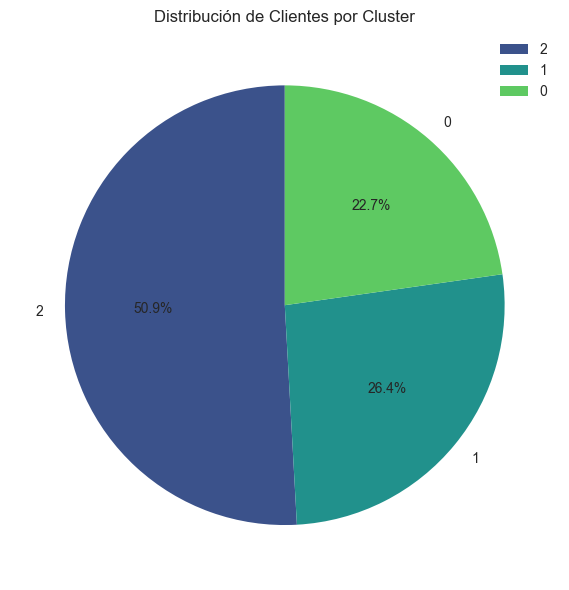


--- Perfil Promedio de Cada Segmento ---
         frequency  recency  monetary_value  avg_ticket  num_unique_products
cluster                                                                     
0            20.34   245.47          326.66      227.64                18.95
1           253.25    32.51         5575.82      496.70               149.92
2            41.82    49.00          727.37      270.00                35.20

Generando visualizaciones para la interpretacion...


C:\Users\Amador\AppData\Local\Temp\ipykernel_34468\1603211359.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y=feature, data=df_interpret, ax=axes[i], showfliers=False, palette='viridis')
C:\Users\Amador\AppData\Local\Temp\ipykernel_34468\1603211359.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y=feature, data=df_interpret, ax=axes[i], showfliers=False, palette='viridis')
C:\Users\Amador\AppData\Local\Temp\ipykernel_34468\1603211359.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster', y=fea

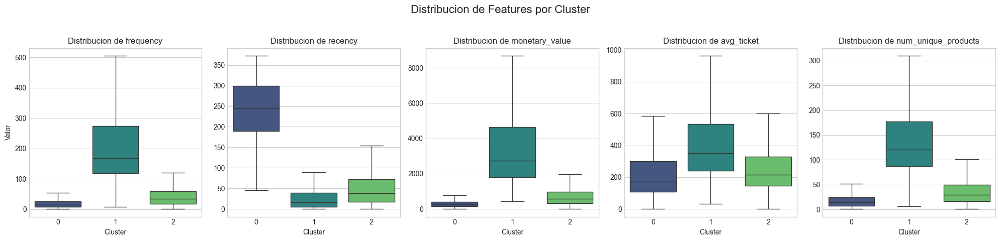

In [ ]:
# --- 3. Combinar Etiquetas con Datos Originales ---
# Anadimos la columna 'cluster' al dataframe original.
# Este es el paso más importante!
df_orig = pd.read_csv('C:\maestria\Ciclo 3\machine learning\segmentación_retail\Data\Clean\df_rfm_without_transformation.csv')
df_interpret = df_orig.copy()
df_interpret['cluster'] = labels_kmeans_final

print("Numero de clientes por cluster:")
print(df_interpret['cluster'].value_counts())

# grafica un gráfico de torta
plt.figure(figsize=(8, 6))
df_interpret['cluster'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=sns.color_palette('viridis', n_colors=len(df_interpret['cluster'].unique())), legend=True)
plt.title('Distribución de Clientes por Cluster')
plt.ylabel('')  # Eliminar la etiqueta del eje y
plt.tight_layout()
plt.show()

# --- 4. Analisis Numerico de los Segmentos ---
# Agrupamos por cluster y calculamos la media de cada variable.
# Esto nos dara el 'perfil' promedio de cada segmento.
segment_summary = df_interpret.groupby('cluster').mean().round(2)

print("\n--- Perfil Promedio de Cada Segmento ---")
print(segment_summary)

# --- 5. Analisis Visual de los Segmentos ---
# Los boxplots son excelentes para ver las diferencias en las distribuciones de cada variable por cluster.
print("\nGenerando visualizaciones para la interpretacion...")
features = ['frequency', 'recency', 'monetary_value', 'avg_ticket', 'num_unique_products']
num_features = len(features)

fig, axes = plt.subplots(1, num_features, figsize=(20, 5))
fig.suptitle('Distribucion de Features por Cluster', fontsize=16)

for i, feature in enumerate(features):
    # y log
    sns.boxplot(x='cluster', y=feature, data=df_interpret, ax=axes[i], showfliers=False, palette='viridis')
    axes[i].set_title(f'Distribucion de {feature}')
    axes[i].set_xlabel('Cluster')
    axes[i].set_ylabel('')

axes[0].set_ylabel('Valor')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig("segment_interpretation_boxplots.png")
# print("Grafico 'segment_interpretation_boxplots.png' guardado.")
plt.show()


In [273]:
segment_summary

,frequency,recency,monetary_value,avg_ticket,num_unique_products
cluster,,,,,
0,20.341117,245.472081,326.659452,227.635585,18.950254
1,253.250438,32.514011,5575.816297,496.696386,149.920315
2,41.817522,49.003631,727.374849,269.998908,35.200635


# pruebas extensivas en DBSCAN


--- Iniciando Grid Search para DBSCAN ---

Probando: eps=0.2, min_samples=20
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.2, min_samples=25
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.2, min_samples=30
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.2, min_samples=35
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.2, min_samples=40
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.2, min_samples=45
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan g

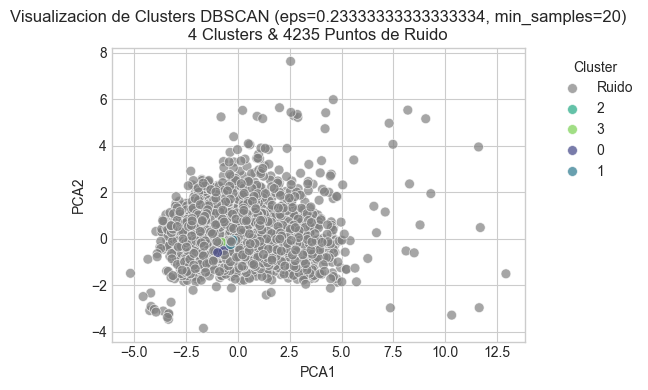


Probando: eps=0.23333333333333334, min_samples=25
  Resultado: 1 clusters encontrados y 4305 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.23333333333333334, min_samples=30
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.23333333333333334, min_samples=35
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.23333333333333334, min_samples=40
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.23333333333333334, min_samples=45
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.23333333333333334, min_samples=50
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No

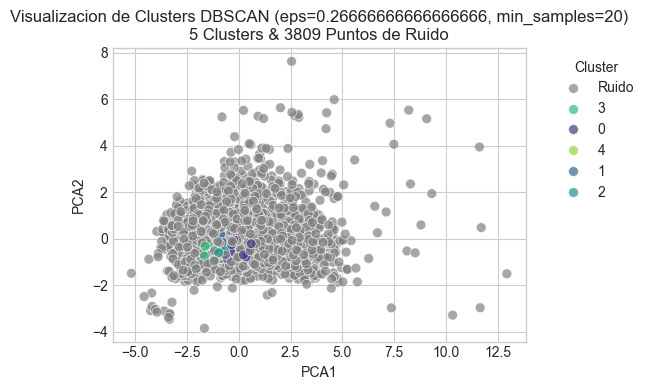


Probando: eps=0.26666666666666666, min_samples=25
  Resultado: 7 clusters encontrados y 4045 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3991
    - Davies-Bouldin Index: 0.9443
    - Calinski-Harabasz Score: 345.12


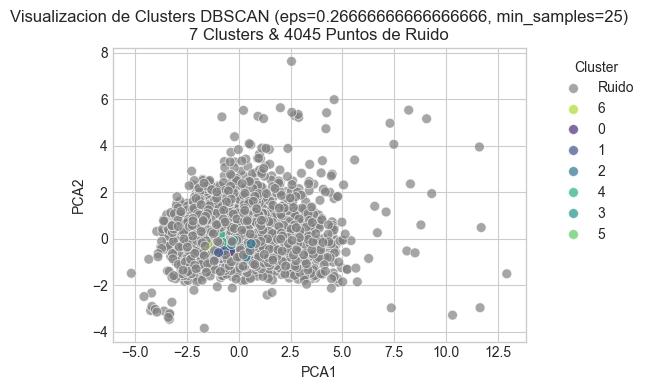


Probando: eps=0.26666666666666666, min_samples=30
  Resultado: 1 clusters encontrados y 4300 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.26666666666666666, min_samples=35
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.26666666666666666, min_samples=40
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.26666666666666666, min_samples=45
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.26666666666666666, min_samples=50
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.26666666666666666, min_samples=55
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No

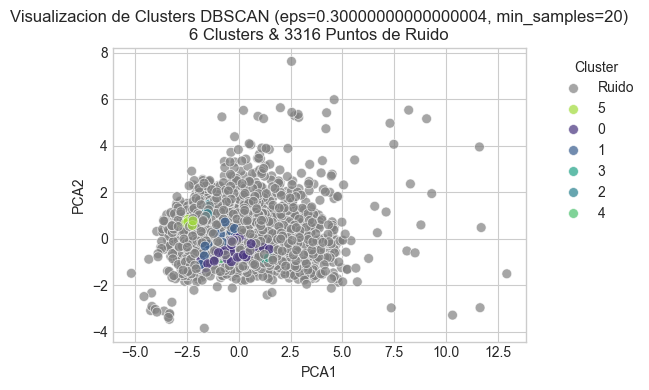


Probando: eps=0.30000000000000004, min_samples=25
  Resultado: 2 clusters encontrados y 3624 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3174
    - Davies-Bouldin Index: 1.1270
    - Calinski-Harabasz Score: 372.58


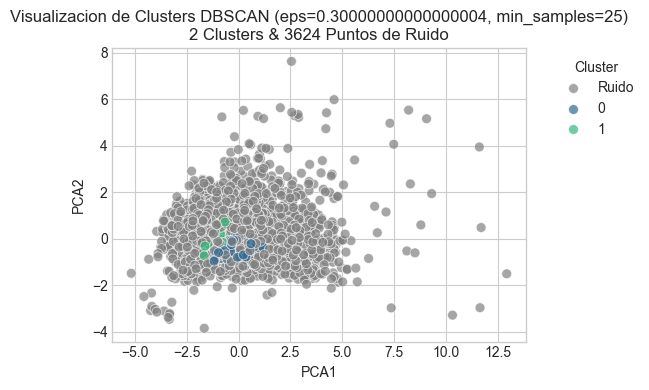


Probando: eps=0.30000000000000004, min_samples=30
  Resultado: 3 clusters encontrados y 3850 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3459
    - Davies-Bouldin Index: 0.7911
    - Calinski-Harabasz Score: 272.02


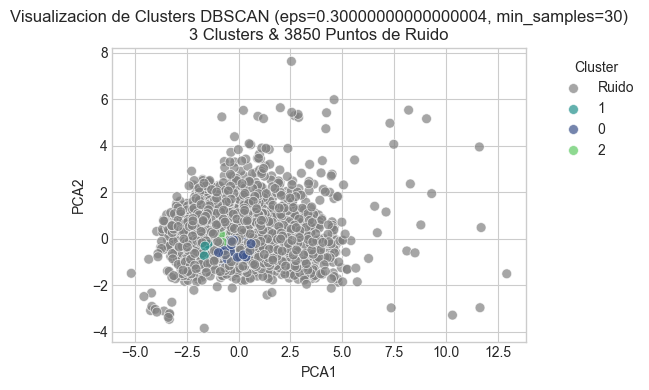


Probando: eps=0.30000000000000004, min_samples=35
  Resultado: 6 clusters encontrados y 4070 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3749
    - Davies-Bouldin Index: 0.9256
    - Calinski-Harabasz Score: 387.35


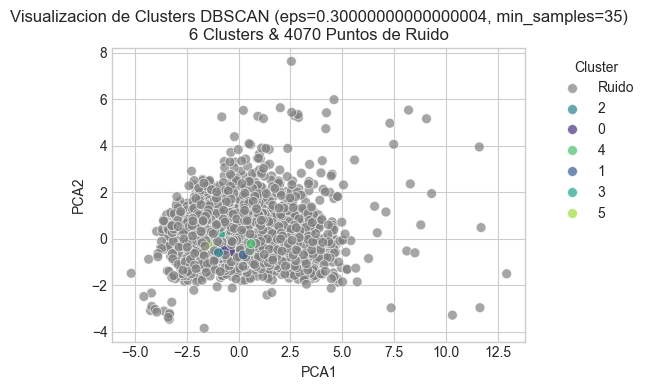


Probando: eps=0.30000000000000004, min_samples=40
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.30000000000000004, min_samples=45
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.30000000000000004, min_samples=50
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.30000000000000004, min_samples=55
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.30000000000000004, min_samples=60
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.30000000000000004, min_samples=65
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No

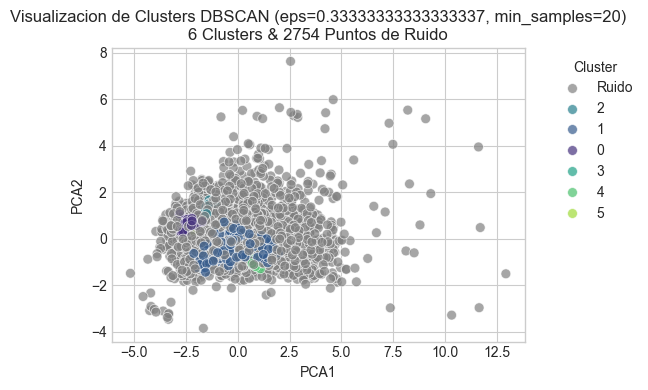


Probando: eps=0.33333333333333337, min_samples=25
  Resultado: 7 clusters encontrados y 3158 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.1706
    - Davies-Bouldin Index: 0.8758
    - Calinski-Harabasz Score: 317.80


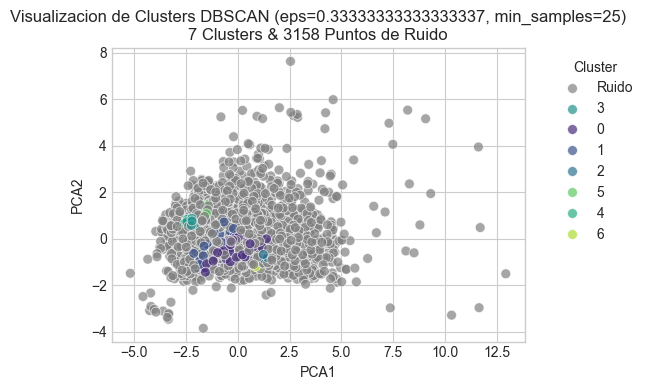


Probando: eps=0.33333333333333337, min_samples=30
  Resultado: 2 clusters encontrados y 3437 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3130
    - Davies-Bouldin Index: 1.1493
    - Calinski-Harabasz Score: 454.11


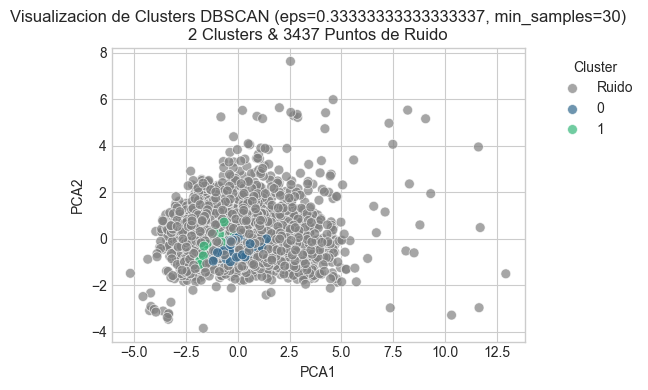


Probando: eps=0.33333333333333337, min_samples=35
  Resultado: 2 clusters encontrados y 3617 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3343
    - Davies-Bouldin Index: 1.0716
    - Calinski-Harabasz Score: 406.45


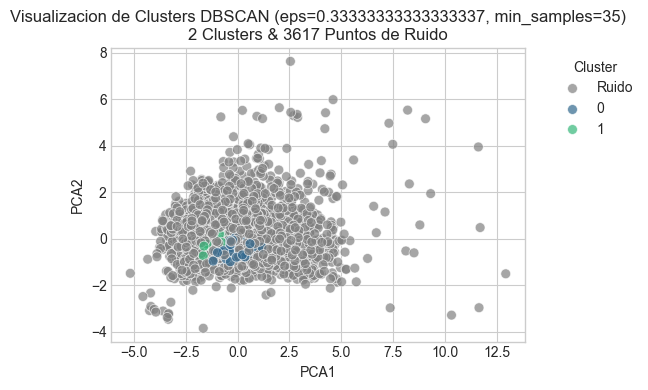


Probando: eps=0.33333333333333337, min_samples=40
  Resultado: 3 clusters encontrados y 3769 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.2956
    - Davies-Bouldin Index: 0.8136
    - Calinski-Harabasz Score: 229.72


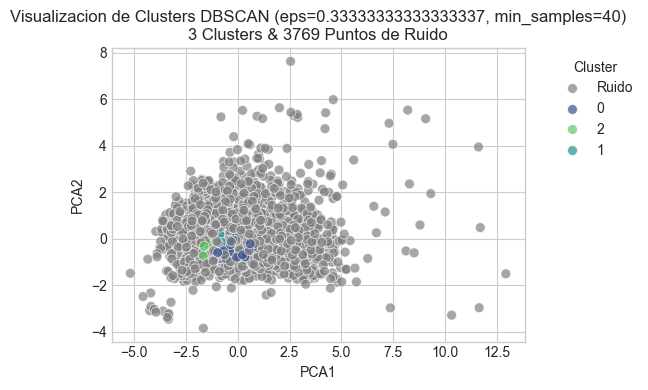


Probando: eps=0.33333333333333337, min_samples=45
  Resultado: 3 clusters encontrados y 3966 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.2915
    - Davies-Bouldin Index: 0.8105
    - Calinski-Harabasz Score: 287.65


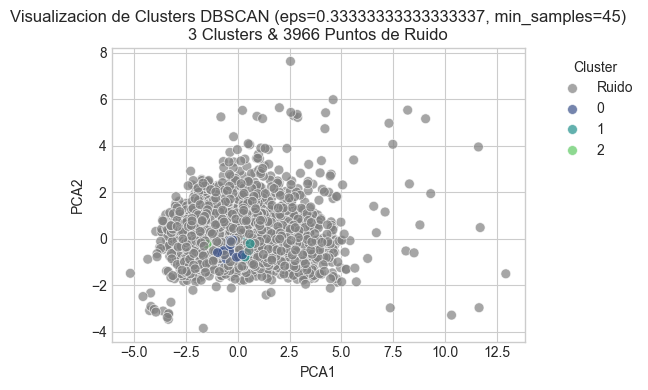


Probando: eps=0.33333333333333337, min_samples=50
  Resultado: 2 clusters encontrados y 4225 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.5850
    - Davies-Bouldin Index: 0.6219
    - Calinski-Harabasz Score: 253.34


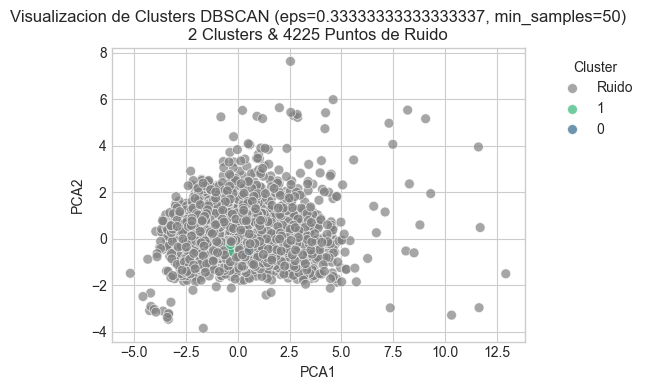


Probando: eps=0.33333333333333337, min_samples=55
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.33333333333333337, min_samples=60
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.33333333333333337, min_samples=65
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.33333333333333337, min_samples=70
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.33333333333333337, min_samples=75
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.33333333333333337, min_samples=80
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No

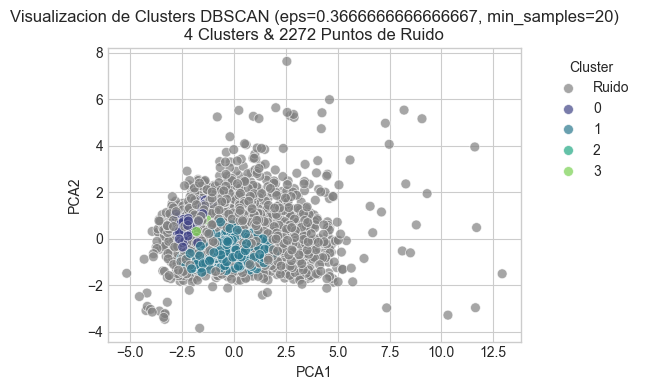


Probando: eps=0.3666666666666667, min_samples=25
  Resultado: 3 clusters encontrados y 2615 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.1922
    - Davies-Bouldin Index: 0.8683
    - Calinski-Harabasz Score: 595.45


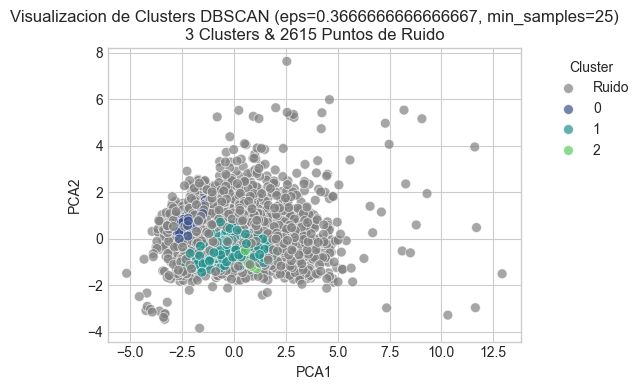


Probando: eps=0.3666666666666667, min_samples=30
  Resultado: 3 clusters encontrados y 2930 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4655
    - Davies-Bouldin Index: 0.5950
    - Calinski-Harabasz Score: 340.51


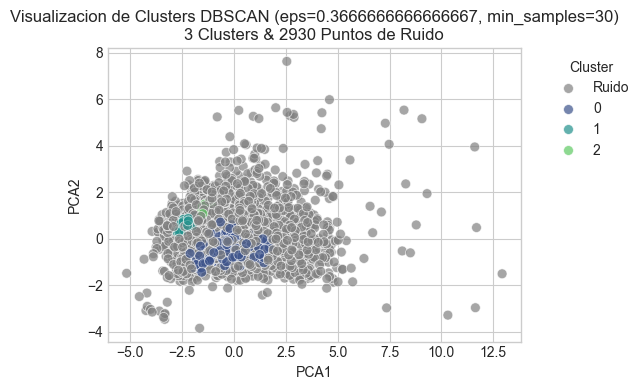


Probando: eps=0.3666666666666667, min_samples=35
  Resultado: 1 clusters encontrados y 3173 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.3666666666666667, min_samples=40
  Resultado: 2 clusters encontrados y 3367 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3021
    - Davies-Bouldin Index: 0.6452
    - Calinski-Harabasz Score: 139.42


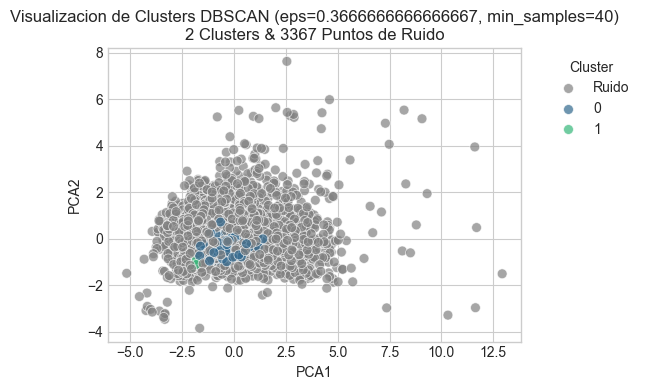


Probando: eps=0.3666666666666667, min_samples=45
  Resultado: 2 clusters encontrados y 3553 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3150
    - Davies-Bouldin Index: 1.0716
    - Calinski-Harabasz Score: 389.39


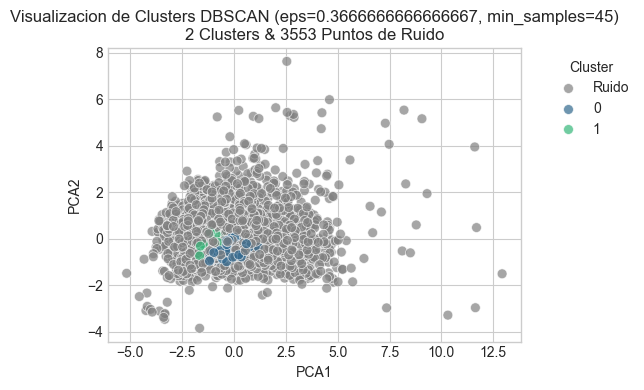


Probando: eps=0.3666666666666667, min_samples=50
  Resultado: 3 clusters encontrados y 3734 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.2798
    - Davies-Bouldin Index: 0.8005
    - Calinski-Harabasz Score: 192.02


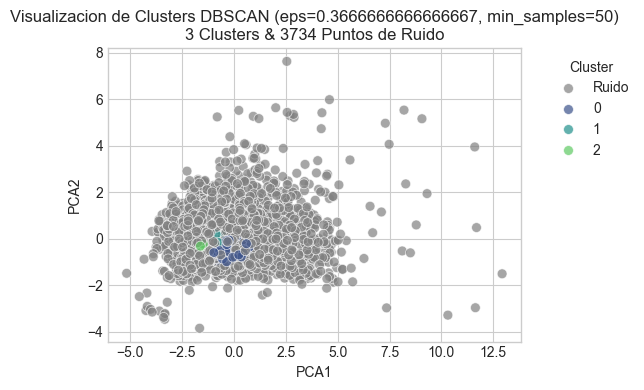


Probando: eps=0.3666666666666667, min_samples=55
  Resultado: 1 clusters encontrados y 3905 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.3666666666666667, min_samples=60
  Resultado: 1 clusters encontrados y 4001 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.3666666666666667, min_samples=65
  Resultado: 2 clusters encontrados y 4076 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4470
    - Davies-Bouldin Index: 0.8196
    - Calinski-Harabasz Score: 315.20


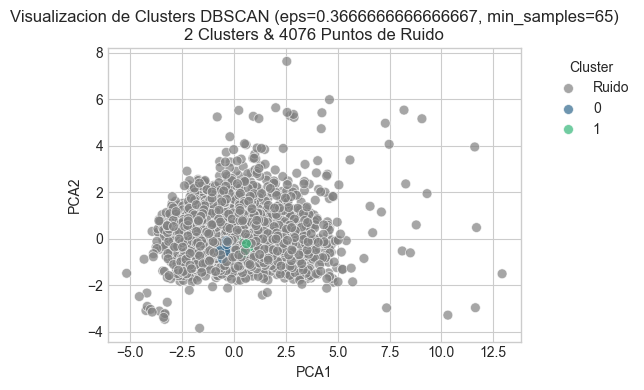


Probando: eps=0.3666666666666667, min_samples=70
  Resultado: 2 clusters encontrados y 4185 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4530
    - Davies-Bouldin Index: 0.8570
    - Calinski-Harabasz Score: 184.62


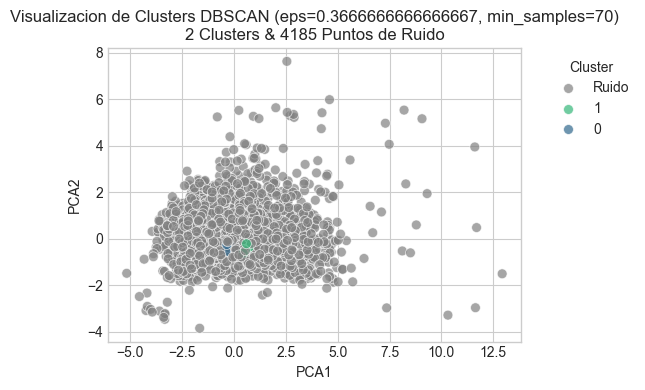


Probando: eps=0.3666666666666667, min_samples=75
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.3666666666666667, min_samples=80
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.3666666666666667, min_samples=85
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.3666666666666667, min_samples=90
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.3666666666666667, min_samples=95
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4, min_samples=20
  Resultado: 2 clusters encontrados y 1829 puntos de ruido.
  Se encontraron clusters

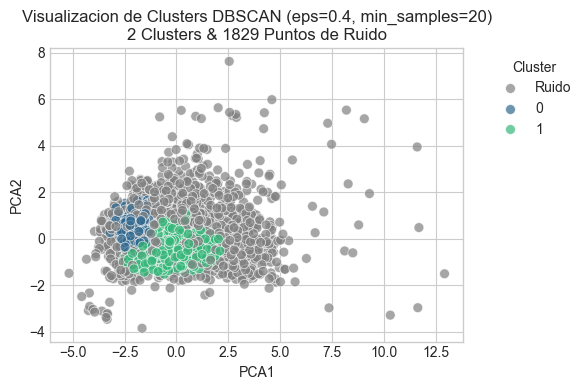


Probando: eps=0.4, min_samples=25
  Resultado: 2 clusters encontrados y 2100 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4438
    - Davies-Bouldin Index: 0.7784
    - Calinski-Harabasz Score: 1332.55


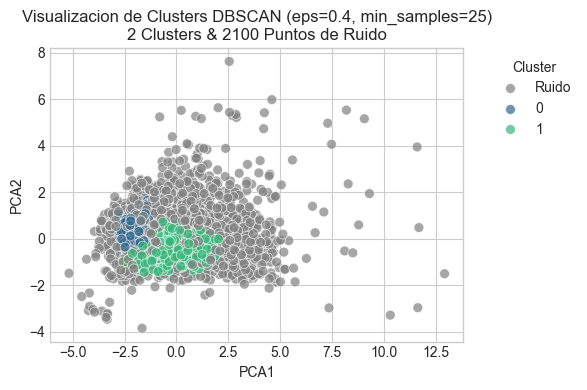


Probando: eps=0.4, min_samples=30
  Resultado: 2 clusters encontrados y 2379 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4843
    - Davies-Bouldin Index: 0.6849
    - Calinski-Harabasz Score: 1098.47


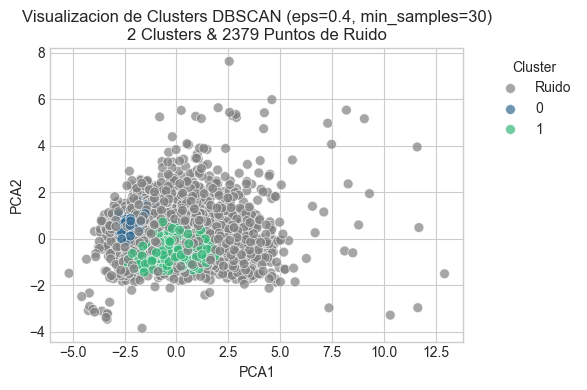


Probando: eps=0.4, min_samples=35
  Resultado: 4 clusters encontrados y 2662 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.1696
    - Davies-Bouldin Index: 0.7154
    - Calinski-Harabasz Score: 281.69


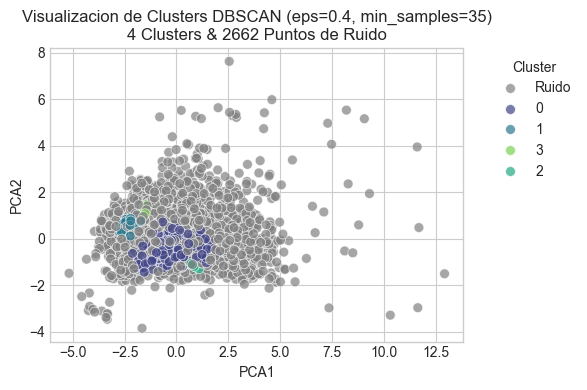


Probando: eps=0.4, min_samples=40
  Resultado: 2 clusters encontrados y 2892 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.5502
    - Davies-Bouldin Index: 0.4423
    - Calinski-Harabasz Score: 335.75


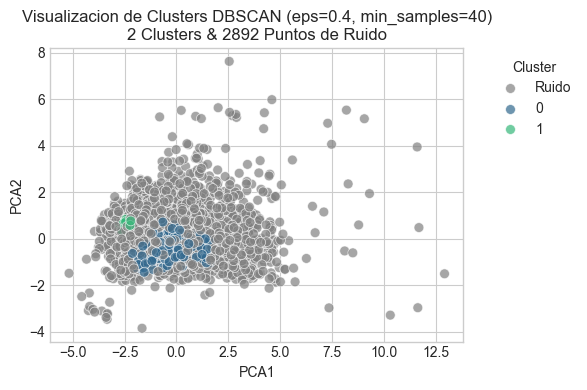


Probando: eps=0.4, min_samples=45
  Resultado: 1 clusters encontrados y 3066 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4, min_samples=50
  Resultado: 2 clusters encontrados y 3198 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.2856
    - Davies-Bouldin Index: 0.6573
    - Calinski-Harabasz Score: 136.42


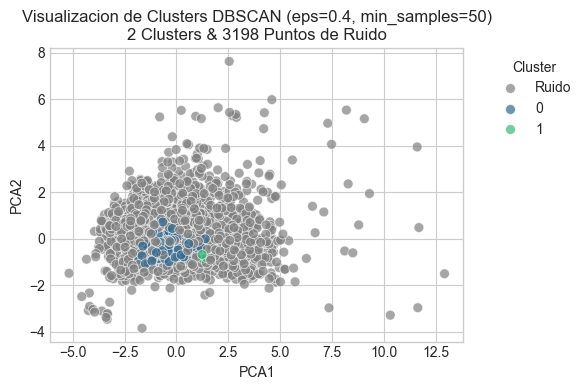


Probando: eps=0.4, min_samples=55
  Resultado: 1 clusters encontrados y 3357 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4, min_samples=60
  Resultado: 2 clusters encontrados y 3554 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.1749
    - Davies-Bouldin Index: 1.1211
    - Calinski-Harabasz Score: 103.45


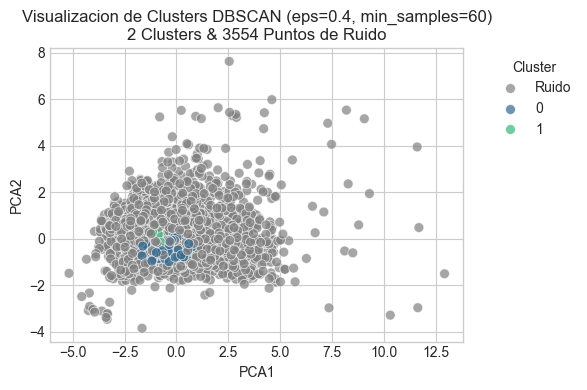


Probando: eps=0.4, min_samples=65
  Resultado: 2 clusters encontrados y 3711 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3212
    - Davies-Bouldin Index: 0.7008
    - Calinski-Harabasz Score: 200.40


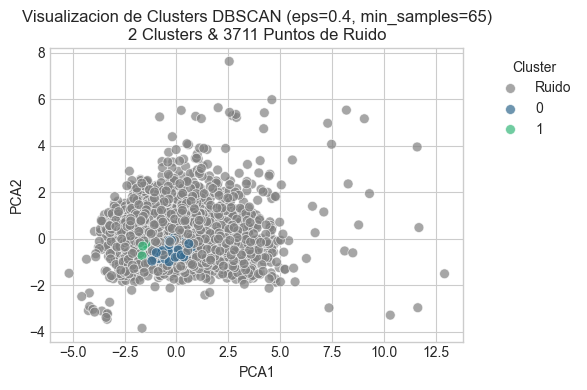


Probando: eps=0.4, min_samples=70
  Resultado: 1 clusters encontrados y 3841 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4, min_samples=75
  Resultado: 1 clusters encontrados y 3910 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4, min_samples=80
  Resultado: 1 clusters encontrados y 3987 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4, min_samples=85
  Resultado: 2 clusters encontrados y 4050 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.3544
    - Davies-Bouldin Index: 0.8627
    - Calinski-Harabasz Score: 190.91


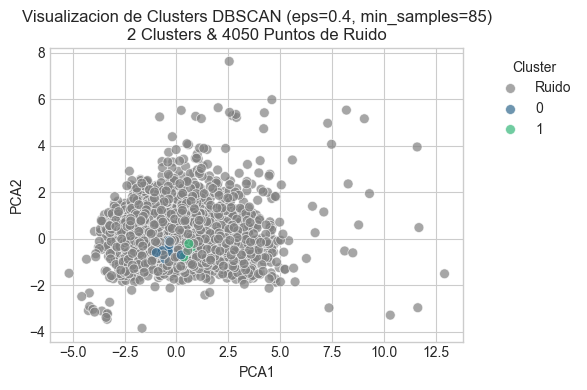


Probando: eps=0.4, min_samples=90
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4, min_samples=95
  Resultado: 0 clusters encontrados y 4330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=20
  Resultado: 1 clusters encontrados y 1471 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=25
  Resultado: 1 clusters encontrados y 1679 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=30
  Resultado: 2 clusters encontrados y 1876 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4241
    - Davies-Bouldin Index: 0.8237
    - Calinski-Harabasz Score: 1489.59


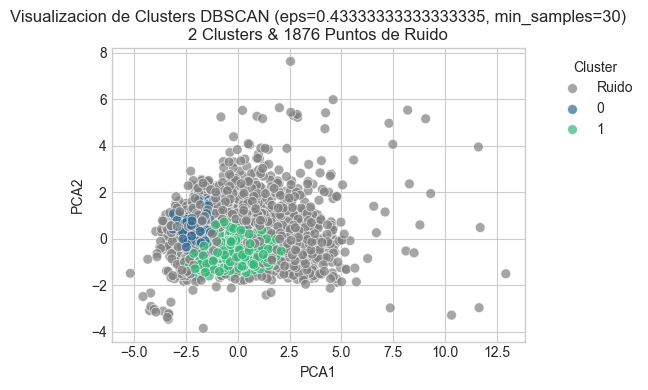


Probando: eps=0.43333333333333335, min_samples=35
  Resultado: 2 clusters encontrados y 2151 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4571
    - Davies-Bouldin Index: 0.7389
    - Calinski-Harabasz Score: 1278.26


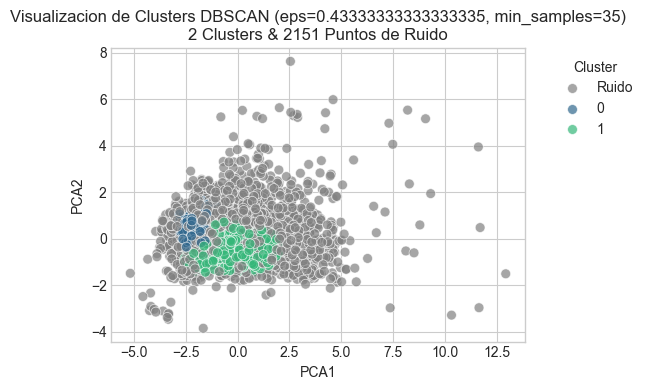


Probando: eps=0.43333333333333335, min_samples=40
  Resultado: 3 clusters encontrados y 2366 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4045
    - Davies-Bouldin Index: 0.6870
    - Calinski-Harabasz Score: 494.01


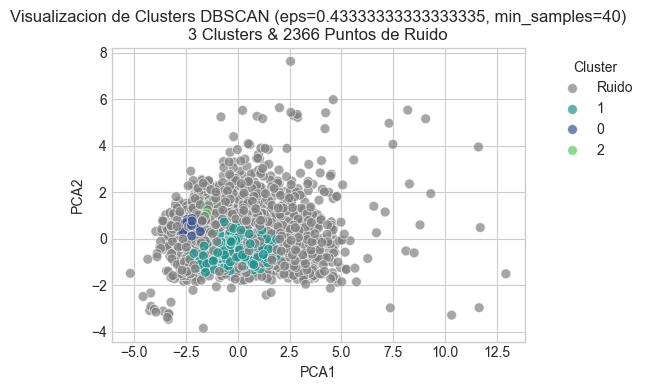


Probando: eps=0.43333333333333335, min_samples=45
  Resultado: 2 clusters encontrados y 2613 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.5071
    - Davies-Bouldin Index: 0.5418
    - Calinski-Harabasz Score: 605.51


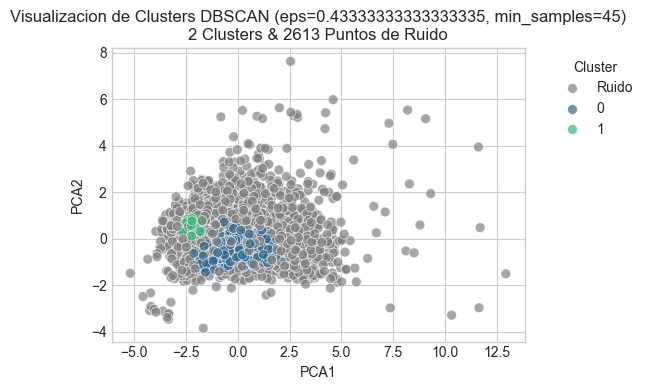


Probando: eps=0.43333333333333335, min_samples=50
  Resultado: 2 clusters encontrados y 2757 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.5051
    - Davies-Bouldin Index: 0.4933
    - Calinski-Harabasz Score: 304.16


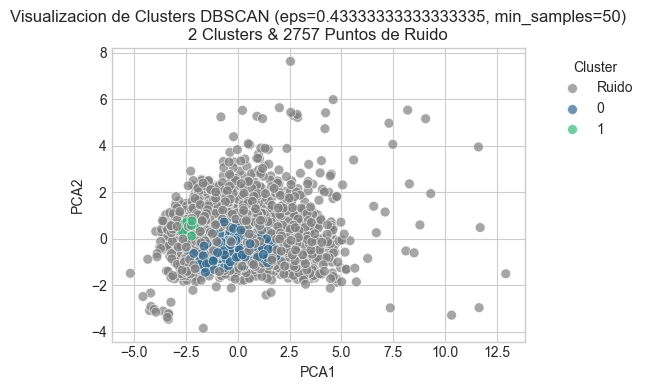


Probando: eps=0.43333333333333335, min_samples=55
  Resultado: 1 clusters encontrados y 2928 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=60
  Resultado: 1 clusters encontrados y 3012 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=65
  Resultado: 1 clusters encontrados y 3160 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=70
  Resultado: 1 clusters encontrados y 3321 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=75
  Resultado: 2 clusters encontrados y 3419 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.1434
    - Davies-Bouldin Index: 1.1600
    - Calinski-Harabasz Score: 89.89


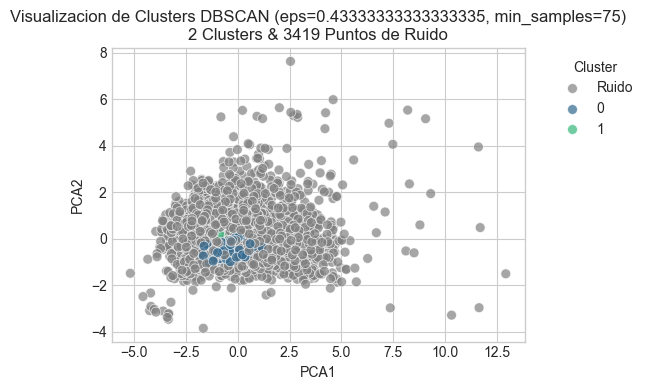


Probando: eps=0.43333333333333335, min_samples=80
  Resultado: 1 clusters encontrados y 3557 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=85
  Resultado: 1 clusters encontrados y 3685 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=90
  Resultado: 1 clusters encontrados y 3773 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.43333333333333335, min_samples=95
  Resultado: 1 clusters encontrados y 3834 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4666666666666667, min_samples=20
  Resultado: 1 clusters encontrados y 1190 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4666666666666667, min_samples=25
  Resultado: 1 clusters encontrados y 1357 puntos de ruido.
  No s

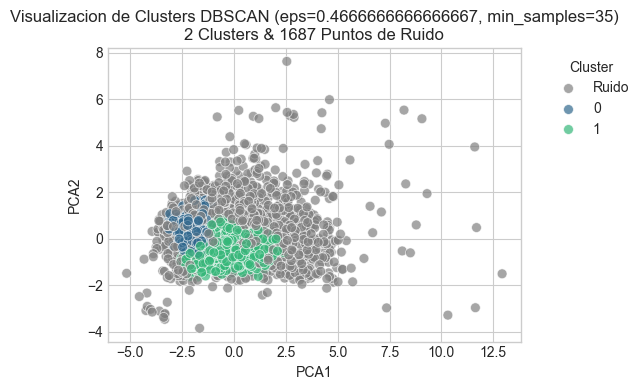


Probando: eps=0.4666666666666667, min_samples=40
  Resultado: 2 clusters encontrados y 1866 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4231
    - Davies-Bouldin Index: 0.8066
    - Calinski-Harabasz Score: 1411.97


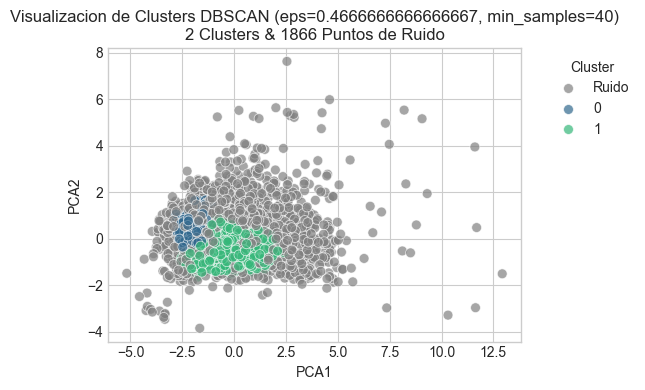


Probando: eps=0.4666666666666667, min_samples=45
  Resultado: 2 clusters encontrados y 2115 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4572
    - Davies-Bouldin Index: 0.7180
    - Calinski-Harabasz Score: 1147.03


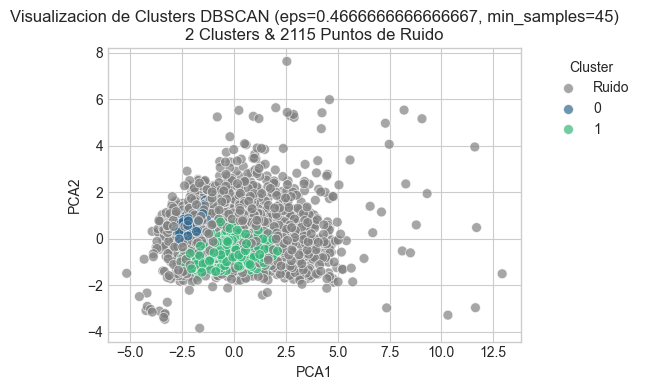


Probando: eps=0.4666666666666667, min_samples=50
  Resultado: 3 clusters encontrados y 2304 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4009
    - Davies-Bouldin Index: 0.7538
    - Calinski-Harabasz Score: 486.94


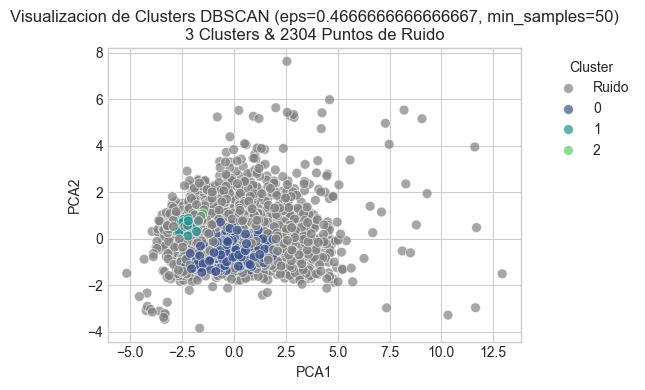


Probando: eps=0.4666666666666667, min_samples=55
  Resultado: 2 clusters encontrados y 2508 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.5108
    - Davies-Bouldin Index: 0.5108
    - Calinski-Harabasz Score: 501.61


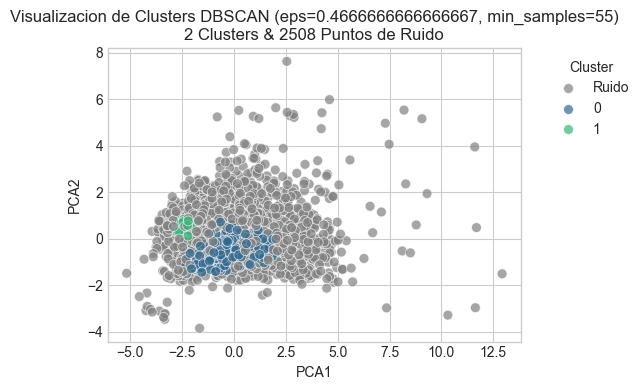


Probando: eps=0.4666666666666667, min_samples=60
  Resultado: 1 clusters encontrados y 2694 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4666666666666667, min_samples=65
  Resultado: 1 clusters encontrados y 2765 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4666666666666667, min_samples=70
  Resultado: 1 clusters encontrados y 2842 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4666666666666667, min_samples=75
  Resultado: 1 clusters encontrados y 2943 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4666666666666667, min_samples=80
  Resultado: 1 clusters encontrados y 3031 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.4666666666666667, min_samples=85
  Resultado: 1 clusters encontrados y 3214 puntos de ruido.
  No se en

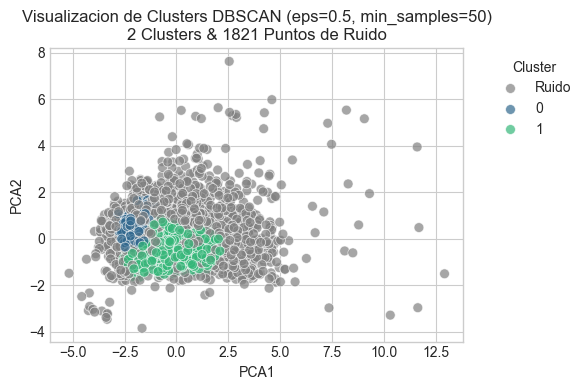


Probando: eps=0.5, min_samples=55
  Resultado: 2 clusters encontrados y 2022 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4514
    - Davies-Bouldin Index: 0.6927
    - Calinski-Harabasz Score: 1113.84


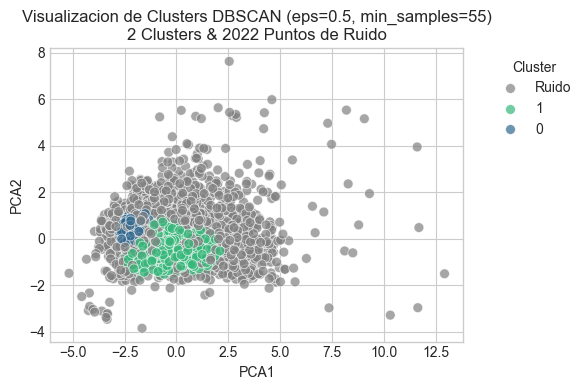


Probando: eps=0.5, min_samples=60
  Resultado: 2 clusters encontrados y 2202 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4835
    - Davies-Bouldin Index: 0.5954
    - Calinski-Harabasz Score: 827.21


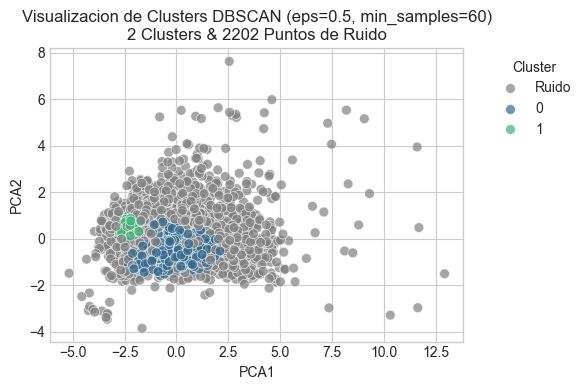


Probando: eps=0.5, min_samples=65
  Resultado: 2 clusters encontrados y 2330 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4805
    - Davies-Bouldin Index: 0.5442
    - Calinski-Harabasz Score: 487.47


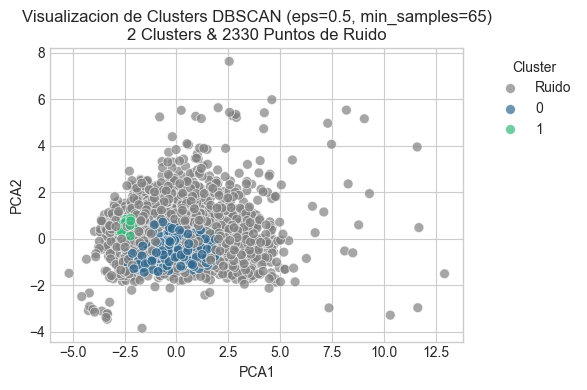


Probando: eps=0.5, min_samples=70
  Resultado: 1 clusters encontrados y 2517 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5, min_samples=75
  Resultado: 1 clusters encontrados y 2591 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5, min_samples=80
  Resultado: 1 clusters encontrados y 2675 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5, min_samples=85
  Resultado: 1 clusters encontrados y 2724 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5, min_samples=90
  Resultado: 1 clusters encontrados y 2786 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5, min_samples=95
  Resultado: 1 clusters encontrados y 2912 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5333333333333333,

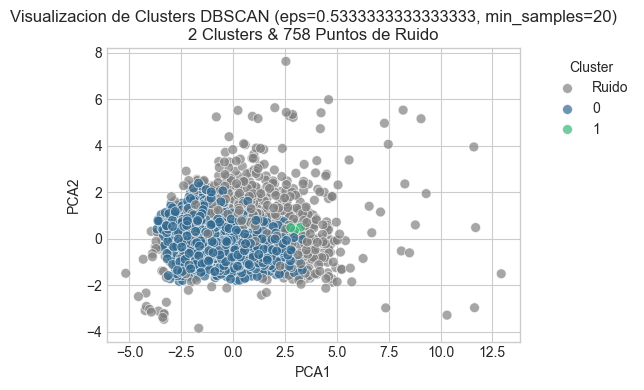


Probando: eps=0.5333333333333333, min_samples=25
  Resultado: 1 clusters encontrados y 905 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5333333333333333, min_samples=30
  Resultado: 1 clusters encontrados y 995 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5333333333333333, min_samples=35
  Resultado: 1 clusters encontrados y 1099 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5333333333333333, min_samples=40
  Resultado: 1 clusters encontrados y 1201 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5333333333333333, min_samples=45
  Resultado: 1 clusters encontrados y 1330 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5333333333333333, min_samples=50
  Resultado: 1 clusters encontrados y 1450 puntos de ruido.
  No se enco

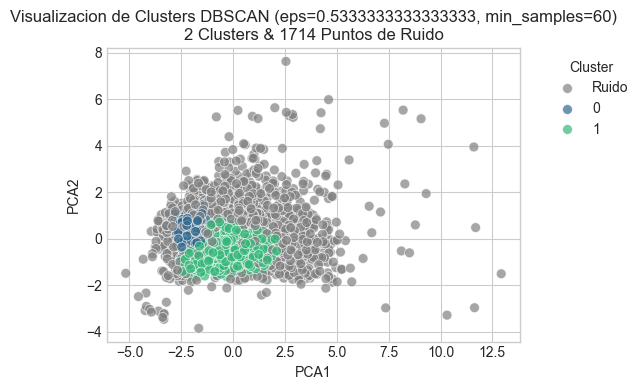


Probando: eps=0.5333333333333333, min_samples=65
  Resultado: 2 clusters encontrados y 1904 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4415
    - Davies-Bouldin Index: 0.7114
    - Calinski-Harabasz Score: 1171.20


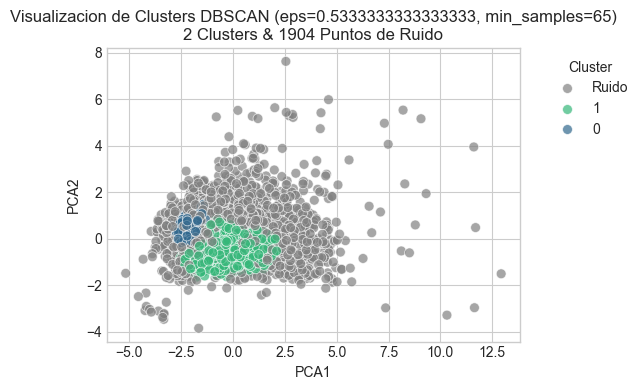


Probando: eps=0.5333333333333333, min_samples=70
  Resultado: 2 clusters encontrados y 2079 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4490
    - Davies-Bouldin Index: 0.6393
    - Calinski-Harabasz Score: 785.25


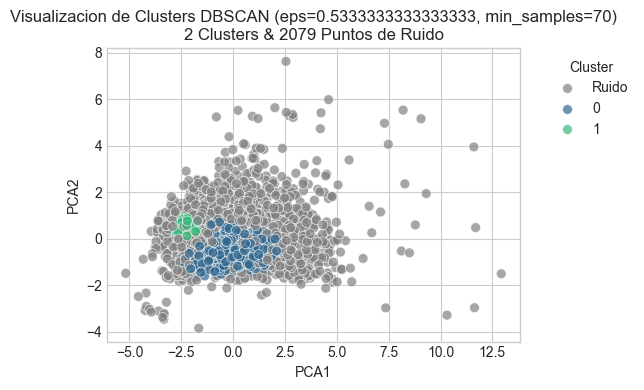


Probando: eps=0.5333333333333333, min_samples=75
  Resultado: 2 clusters encontrados y 2176 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4576
    - Davies-Bouldin Index: 0.6092
    - Calinski-Harabasz Score: 628.60


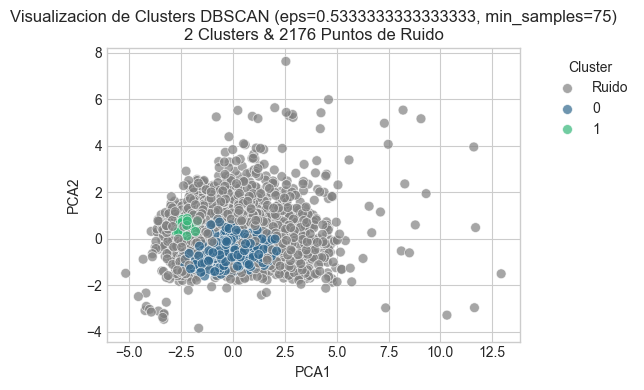


Probando: eps=0.5333333333333333, min_samples=80
  Resultado: 2 clusters encontrados y 2284 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4632
    - Davies-Bouldin Index: 0.5512
    - Calinski-Harabasz Score: 405.55


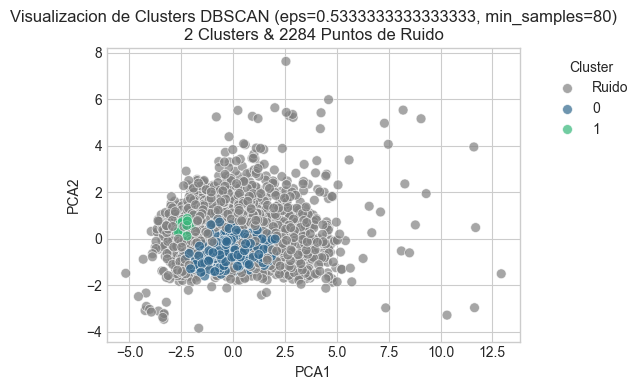


Probando: eps=0.5333333333333333, min_samples=85
  Resultado: 1 clusters encontrados y 2422 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5333333333333333, min_samples=90
  Resultado: 1 clusters encontrados y 2502 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5333333333333333, min_samples=95
  Resultado: 1 clusters encontrados y 2570 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5666666666666667, min_samples=20
  Resultado: 1 clusters encontrados y 648 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5666666666666667, min_samples=25
  Resultado: 1 clusters encontrados y 765 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.5666666666666667, min_samples=30
  Resultado: 1 clusters encontrados y 843 puntos de ruido.
  No se encon

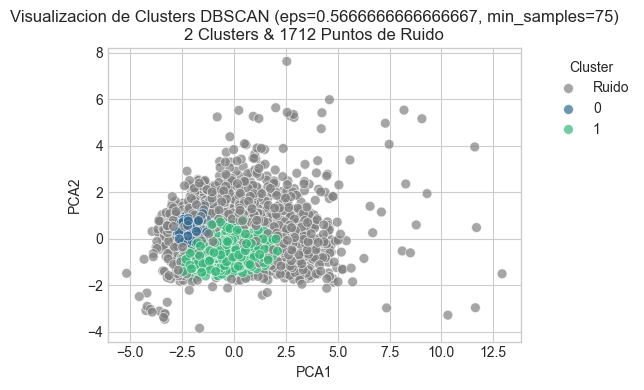


Probando: eps=0.5666666666666667, min_samples=80
  Resultado: 2 clusters encontrados y 1866 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4364
    - Davies-Bouldin Index: 0.7175
    - Calinski-Harabasz Score: 1170.07


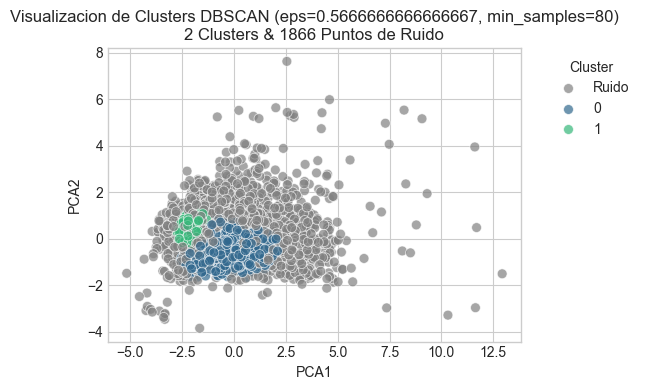


Probando: eps=0.5666666666666667, min_samples=85
  Resultado: 2 clusters encontrados y 1995 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4440
    - Davies-Bouldin Index: 0.6621
    - Calinski-Harabasz Score: 868.35


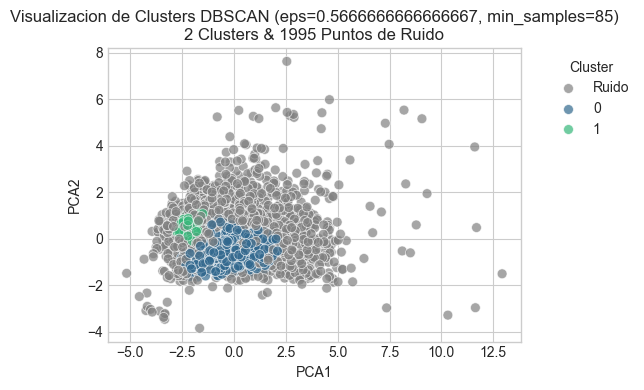


Probando: eps=0.5666666666666667, min_samples=90
  Resultado: 2 clusters encontrados y 2160 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4511
    - Davies-Bouldin Index: 0.5712
    - Calinski-Harabasz Score: 438.56


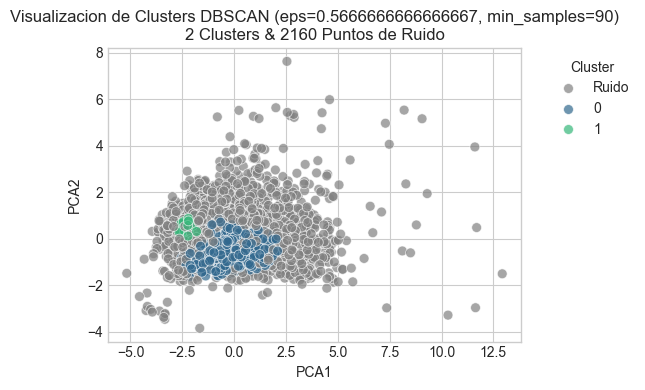


Probando: eps=0.5666666666666667, min_samples=95
  Resultado: 1 clusters encontrados y 2277 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6000000000000001, min_samples=20
  Resultado: 1 clusters encontrados y 514 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6000000000000001, min_samples=25
  Resultado: 1 clusters encontrados y 609 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6000000000000001, min_samples=30
  Resultado: 1 clusters encontrados y 701 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6000000000000001, min_samples=35
  Resultado: 1 clusters encontrados y 780 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6000000000000001, min_samples=40
  Resultado: 1 clusters encontrados y 831 puntos de ruido.
  No se encontr

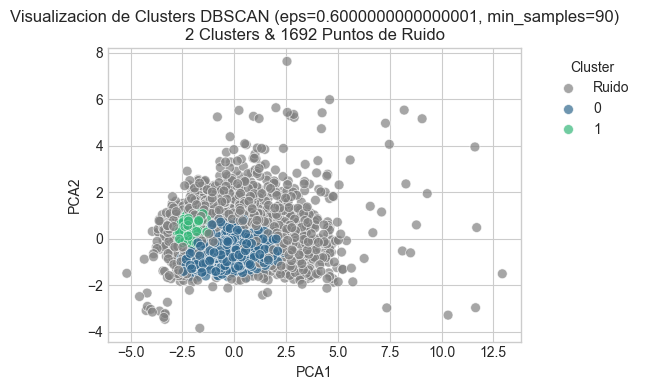


Probando: eps=0.6000000000000001, min_samples=95
  Resultado: 2 clusters encontrados y 1824 puntos de ruido.
  Se encontraron clusters validos. Generando graficos...
    - Silhouette Score: 0.4236
    - Davies-Bouldin Index: 0.7118
    - Calinski-Harabasz Score: 1021.48


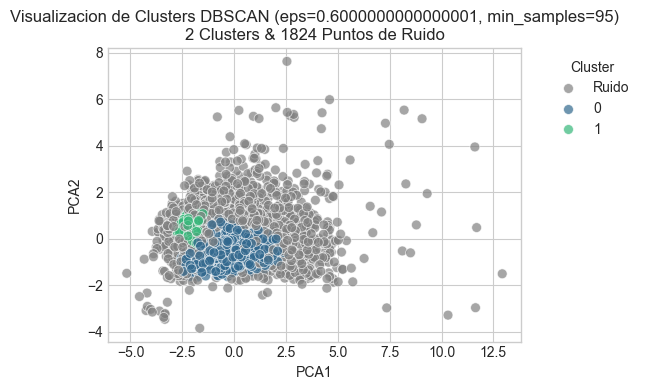


Probando: eps=0.6333333333333333, min_samples=20
  Resultado: 1 clusters encontrados y 432 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6333333333333333, min_samples=25
  Resultado: 1 clusters encontrados y 509 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6333333333333333, min_samples=30
  Resultado: 1 clusters encontrados y 578 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6333333333333333, min_samples=35
  Resultado: 1 clusters encontrados y 651 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6333333333333333, min_samples=40
  Resultado: 1 clusters encontrados y 707 puntos de ruido.
  No se encontraron suficientes clusters. No se generan graficos.

Probando: eps=0.6333333333333333, min_samples=45
  Resultado: 1 clusters encontrados y 762 puntos de ruido.
  No se encontra

In [ ]:
# --- Definicion del Grid Search para DBSCAN ---
# AJUSTA ESTOS RANGOS segun las caracteristicas de tus datos.
# eps_values = [0.8, 1.0, 1.2, 1.5]
# linespace
eps_values = np.linspace(0.2, 1, 25)
# min_samples_values = [5, 10, 15, 20]
min_samples_values = np.arange(20, 100, 5)  # Convertir a enteros

# Directorio para guardar los graficos generados
# output_dir = 'dbscan_grid_search_results'
# if not os.path.exists(output_dir):
#     os.makedirs(output_dir)

print(f"\n--- Iniciando Grid Search para DBSCAN ---")
# print(f"Los graficos se guardaran en la carpeta: '{output_dir}'")

# --- Bucle de Grid Search ---
for eps in eps_values:
    for min_samples in min_samples_values:
        print(f"\nProbando: eps={eps}, min_samples={min_samples}")

        # Entrenar el modelo DBSCAN
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
        labels = dbscan.fit_predict(X)

        # Contar clusters y ruido
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        print(f"  Resultado: {n_clusters} clusters encontrados y {n_noise} puntos de ruido.")

        # --- Condicion: Solo graficar si hay mas de 1 cluster ---
        if n_clusters > 1:
            print("  Se encontraron clusters validos. Generando graficos...")

            # Preparar datos para metricas (excluyendo el ruido)
            mask = labels != -1
            X_filtered = X[mask]
            labels_filtered = labels[mask]

            # Calcular metricas
            silhouette = silhouette_score(X_filtered, labels_filtered)
            davies_bouldin = davies_bouldin_score(X_filtered, labels_filtered)
            calinski_harabasz = calinski_harabasz_score(X_filtered, labels_filtered)
            
            print(f"    - Silhouette Score: {silhouette:.4f}")
            print(f"    - Davies-Bouldin Index: {davies_bouldin:.4f}")
            print(f"    - Calinski-Harabasz Score: {calinski_harabasz:.2f}")

            # 2. Visualizacion de Clusters en 2D
            df_pca = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
            df_pca['cluster'] = labels
            df_pca['cluster_str'] = df_pca['cluster'].astype(str)
            df_pca.loc[df_pca['cluster'] == -1, 'cluster_str'] = 'Ruido'
            plt.figure(figsize=(6, 4))
            
            unique_clusters = sorted(df_pca['cluster_str'].unique())
            if 'Ruido' in unique_clusters:
                palette = sns.color_palette('viridis', n_colors=len(unique_clusters) - 1)
                palette_dict = {c: p for c, p in zip([c for c in unique_clusters if c != 'Ruido'], palette)}
                palette_dict['Ruido'] = (0.5, 0.5, 0.5)
            else:
                 palette_dict = {c: p for c, p in zip(unique_clusters, sns.color_palette('viridis', n_colors=len(unique_clusters)))}
                
            sns.scatterplot(
                data=df_pca, x='PCA1', y='PCA2', hue='cluster_str',
                palette=palette_dict, alpha=0.7, s=50
            )
            plt.title(f'Visualizacion de Clusters DBSCAN (eps={eps}, min_samples={min_samples})\n{n_clusters} Clusters & {n_noise} Puntos de Ruido')
            plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
            plt.tight_layout()
            plt.show()
            # clusters_filename = os.path.join(output_dir, f'clusters_eps_{eps}_ms_{min_samples}.png')
            # plt.savefig(clusters_filename)
            # plt.close()

        else:
            print("  No se encontraron suficientes clusters. No se generan graficos.")

print("\n--- Grid Search Finalizado ---")